# XAI Analysis

---
Group Members :
- Maximilian Sulistiyo (13522061)
- Marvel Pangondian (13522075)

## Load Libraries


In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns
from torchvision import models
from sklearn.metrics import f1_score
import random
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset
import torch.nn.functional as F
import cv2
import gdown
import zipfile


def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(seed=42)

In [2]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

from captum.attr import IntegratedGradients, GradientShap, Saliency
from captum.attr import visualization as viz
from captum.attr import GradientShap

from torch.autograd import Variable

/home/marv2203/kuliah/sms_7/rpp/IF4070-Tugas-Implementasi-XAI/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Load Dataset

In [3]:
FILE_ID = "1k21i-pOjT4zC7SJXoEHpRLw7kdS1EVQT"
url = f"https://drive.google.com/uc?id={FILE_ID}"

# Download the zip file
output = "dataset.zip"
gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1k21i-pOjT4zC7SJXoEHpRLw7kdS1EVQT
From (redirected): https://drive.google.com/uc?id=1k21i-pOjT4zC7SJXoEHpRLw7kdS1EVQT&confirm=t&uuid=be3681d0-46b1-4f8c-9ac8-b4a12b1b13d5
To: /home/marv2203/kuliah/sms_7/rpp/IF4070-Tugas-Implementasi-XAI/src/dataset.zip
100%|██████████| 574M/574M [01:45<00:00, 5.43MB/s] 


'dataset.zip'

In [4]:
# Unzip
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall("./competition_data")

# Update paths
TRAIN_CSV = "./competition_data/train.csv"
TEST_CSV = "./competition_data/test.csv"
TRAIN_IMG_DIR = "./competition_data/images/images/train"
TEST_IMG_DIR = "./competition_data/images/images/test"

In [5]:
training_dataset = pd.read_csv(TRAIN_CSV)
test_dataset = pd.read_csv(TEST_CSV)
training_dataset

,Image,Species_Label
0,eceecd68-aae4-41b5-86fe-5a0b954b038e.jpg,0
1,224f5a7b-e6ad-479d-a6ae-a26812e4e038.jpg,0
2,461e8e5f-8221-441c-971a-aecfcaf05564.jpg,0
3,a62fab23-6107-46e5-aae0-7ff9bc0a2363.jpg,1
4,7e27f920-cecd-4d86-9e2a-9a667b14d787.jpg,1
...,...,...
12495,99b2ac88-cf48-4ec8-9e5f-4104a4821b81.jpg,1
12496,1c0b09ef-a9ea-4e26-9b00-b03d65815731.jpg,0
12497,d6bd7dc0-5bd0-4369-b715-a6408165b16c.jpg,0
12498,b46c602b-ea24-47b4-b319-5f6eb1028ea6.jpg,1


In [6]:
train_set, val_set = train_test_split(
    training_dataset,
    test_size=0.2,
    random_state=42,
    stratify=training_dataset["Species_Label"]
)

In [7]:
IMAGE_SIZE = 224

train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [8]:
class PetDataset(Dataset):
    def __init__(self, dataframe, img_dir, transform=None):
        self.dataframe = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = self.dataframe.iloc[idx]['Image']
        label = self.dataframe.iloc[idx]['Species_Label']
        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label

In [9]:
train_dataset = PetDataset(train_set, TRAIN_IMG_DIR, transform=train_transform)
val_dataset = PetDataset(val_set, TRAIN_IMG_DIR, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

## Load Model

In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

FILE_ID = "1_9jwIS4-2hxkKq6qzzn2T0VLe7nlKZi2"
url = f"https://drive.google.com/uc?id={FILE_ID}"

MODEL_SAVE_DIR = "./saved_models"
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
MODEL_PATH = os.path.join(MODEL_SAVE_DIR, "efficientnet_model.pth")

gdown.download(url, MODEL_PATH, quiet=False)
print(f"Model downloaded to: {MODEL_PATH}")

checkpoint = torch.load(MODEL_PATH, map_location=device)
print(f"Checkpoint loaded")

# Recreate the model architecture
efficientnet = models.efficientnet_v2_s(weights=None)
num_ftrs = efficientnet.classifier[1].in_features
efficientnet.classifier[1] = nn.Linear(num_ftrs, checkpoint["num_classes"])

# Load the trained weights
efficientnet.load_state_dict(checkpoint["model_state_dict"])
efficientnet = efficientnet.to(device)
efficientnet.eval()

print(f"Architecture: {checkpoint['model_architecture']}")
print(f"Number of classes: {checkpoint['num_classes']}")

Using device: cuda


Downloading...
From (original): https://drive.google.com/uc?id=1_9jwIS4-2hxkKq6qzzn2T0VLe7nlKZi2
From (redirected): https://drive.google.com/uc?id=1_9jwIS4-2hxkKq6qzzn2T0VLe7nlKZi2&confirm=t&uuid=8b945c5d-0acd-4cca-aae9-8a8bd46ad171
To: /home/marv2203/kuliah/sms_7/rpp/IF4070-Tugas-Implementasi-XAI/src/saved_models/efficientnet_model.pth
100%|██████████| 81.6M/81.6M [00:16<00:00, 4.81MB/s]


Model downloaded to: ./saved_models/efficientnet_model.pth
Checkpoint loaded
Architecture: efficientnet_b0
Number of classes: 2


## Helper Functions

In [11]:
def denormalize_image(img_tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

def show_image(img_tensor, title="Image"):
    img = denormalize_image(img_tensor)
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

## Grad-CAM Implementation

In [12]:
class GradCAM:
    def __init__(self):
        self.gradients = None
        self.activations = None
        self.handles = []

    def save_gradient(self, grad):
        self.gradients = grad

    def forward_hook(self, module, input, output):
        self.activations = output.detach()
        if output.requires_grad:
            handle = output.register_hook(self.save_gradient)
            self.handles.append(handle)

    def generate_cam(self, model, input_image, target_class, target_layer):
        self.clear_hooks()

        model.eval()
        self.gradients = None
        self.activations = None

        forward_handle = target_layer.register_forward_hook(self.forward_hook)
        self.handles.append(forward_handle)

        # prepare input
        input_image = input_image.unsqueeze(0).to(device)
        input_image.requires_grad = True

        # forward pass
        output = model(input_image)

        # get score
        class_score = output[0, target_class]

        model.zero_grad()

        # Backward pass
        class_score.backward()

        self.clear_hooks()

        # Pool the gradients across the channels
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])

        # Weight the channels by corresponding gradients
        activations = self.activations.clone()
        for i in range(activations.shape[1]):
            activations[:, i, :, :] *= pooled_gradients[i]

        # Average the channels
        heatmap = torch.mean(activations, dim=1).squeeze()

        # ReLU on top of the heatmap
        heatmap = F.relu(heatmap)

        # Normalize the heatmap
        if torch.max(heatmap) > 0:
            heatmap = heatmap / torch.max(heatmap)

        return heatmap.detach().cpu().numpy()

    def clear_hooks(self):
        """Remove all registered hooks"""
        for handle in self.handles:
            handle.remove()
        self.handles = []


def visualize_gradcam(model, image_tensor, target_class, original_image, class_names):

    target_layer = model.features[-1]

    gradcam = GradCAM()

    heatmap = gradcam.generate_cam(model, image_tensor, target_class, target_layer)

    heatmap_resized = cv2.resize(heatmap, (224, 224))

    heatmap_colored = cv2.applyColorMap(
        np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET
    )
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    superimposed = heatmap_colored * 0.4 + original_image * 255
    superimposed = np.clip(superimposed, 0, 255)
    superimposed = superimposed / 255.0

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(original_image)
    axes[0].set_title("Original Image", fontsize=12)
    axes[0].axis("off")

    axes[1].imshow(heatmap_resized, cmap="jet")
    axes[1].set_title(
        f"Grad-CAM Heatmap\nPredicted: {class_names[target_class]}", fontsize=12
    )
    axes[1].axis("off")

    axes[2].imshow(superimposed)
    axes[2].set_title("Grad-CAM Overlay", fontsize=12)
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    return heatmap_resized


## LIME Implementation

In [13]:
def predict_fn_for_lime(images):
    model = efficientnet
    model.eval()

    batch = torch.stack(
        [val_transform(Image.fromarray(img.astype("uint8"))) for img in images]
    )
    batch = batch.to(device)

    with torch.no_grad():
        outputs = model(batch)
        probs = F.softmax(outputs, dim=1)

    return probs.cpu().numpy()


def visualize_lime(image_tensor, true_label, predicted_label, class_names):
    img_np = denormalize_image(image_tensor)
    img_np = (img_np * 255).astype(np.uint8)

    explainer = lime_image.LimeImageExplainer()

    explanation = explainer.explain_instance(
        img_np, predict_fn_for_lime, top_labels=2, hide_color=0, num_samples=1000
    )

    temp, mask = explanation.get_image_and_mask(
        predicted_label, positive_only=True, num_features=10, hide_rest=False
    )

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(img_np)
    axes[0].set_title(f"Original Image\nTrue: {class_names[true_label]}")
    axes[0].axis("off")

    axes[1].imshow(mark_boundaries(temp, mask))
    axes[1].set_title(f"LIME Explanation\nPredicted: {class_names[predicted_label]}")
    axes[1].axis("off")

    axes[2].imshow(mask, cmap="gray")
    axes[2].set_title("Important Regions (Mask)")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    return explanation

## Occlusion Implementation

In [14]:
def visualize_occlusion(model, image_tensor, true_label, predicted_label, class_names):
    try:
        from captum.attr import Occlusion

        model.eval()
        occlusion = Occlusion(model)
        input_img = image_tensor.unsqueeze(0).to(device)

        # Get attributions - sliding window of 15x15 with stride of 8
        attributions = occlusion.attribute(
            input_img,
            target=predicted_label,
            strides=(3, 8, 8),  # (channels, height, width)
            sliding_window_shapes=(3, 15, 15),  # size of occlusion patch
            baselines=0,  # what to replace with (black)
        )

        attr_numpy = attributions.squeeze().cpu().detach().numpy()
        attr_numpy = np.transpose(attr_numpy, (1, 2, 0))

        original_image = denormalize_image(image_tensor)

        attr_heatmap = np.abs(attr_numpy).mean(axis=2)

        if attr_heatmap.max() > attr_heatmap.min():
            attr_norm = (attr_heatmap - attr_heatmap.min()) / (
                attr_heatmap.max() - attr_heatmap.min()
            )
        else:
            attr_norm = attr_heatmap

        from scipy.ndimage import gaussian_filter

        attr_smooth = gaussian_filter(attr_norm, sigma=1.5)

        heatmap_colored = cv2.applyColorMap(
            np.uint8(255 * attr_smooth), cv2.COLORMAP_JET
        )
        heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB) / 255.0
        overlay = heatmap_colored * 0.5 + original_image * 0.5

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        axes[0].imshow(original_image)
        axes[0].set_title(
            f"Original Image\nTrue: {class_names[true_label]}\nPredicted: {class_names[predicted_label]}",
            fontsize=11,
            fontweight="bold",
        )
        axes[0].axis("off")

        im1 = axes[1].imshow(attr_smooth, cmap="hot", vmin=0, vmax=1)
        axes[1].set_title(
            "Occlusion Importance Map\n(Brighter = More Critical)",
            fontsize=11,
            fontweight="bold",
        )
        axes[1].axis("off")
        plt.colorbar(im1, ax=axes[1], fraction=0.046)

        axes[2].imshow(overlay)
        axes[2].set_title(
            "Occlusion Overlay\n(Red = Prediction drops when hidden)",
            fontsize=11,
            fontweight="bold",
        )
        axes[2].axis("off")

        plt.suptitle(
            f"Occlusion Analysis - Prediction: {class_names[predicted_label]}",
            fontsize=14,
            fontweight="bold",
            y=0.98,
        )
        plt.tight_layout()
        plt.show()

        return attributions

    except Exception as e:
        print(f"Occlusion analysis failed: {e}")
        import traceback

        traceback.print_exc()

        original_image = denormalize_image(image_tensor)
        plt.figure(figsize=(8, 6))
        plt.imshow(original_image)
        plt.title(f"Occlusion Analysis Error", fontsize=12)
        plt.axis("off")
        plt.show()
        return None

## Integrated Gradients Implementation

In [15]:
def visualize_integrated_gradients(
    model, image_tensor, true_label, predicted_label, class_names
):

    model.eval()

    ig = IntegratedGradients(model)

    input_img = image_tensor.unsqueeze(0).to(device)
    input_img.requires_grad = True

    baseline = torch.zeros_like(input_img).to(device)
    attributions_ig = ig.attribute(
        input_img, baselines=baseline, target=predicted_label, n_steps=50
    )

    attributions_np = attributions_ig.squeeze().cpu().detach().numpy()
    attributions_np = np.transpose(attributions_np, (1, 2, 0))

    original_image = denormalize_image(image_tensor)

    attr_positive = np.maximum(0, attributions_np).sum(axis=2)

    attr_norm = (attr_positive - attr_positive.min()) / (
        attr_positive.max() - attr_positive.min() + 1e-8
    )

    heatmap = cv2.applyColorMap(np.uint8(255 * attr_norm), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
    overlay = heatmap * 0.4 + original_image * 0.6

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(original_image)
    axes[0].set_title(f"Original Image\nTrue: {class_names[true_label]}")
    axes[0].axis("off")

    im = axes[1].imshow(attr_norm, cmap="hot")
    axes[1].set_title(
        f"Integrated Gradients\nPredicted: {class_names[predicted_label]}"
    )
    axes[1].axis("off")
    plt.colorbar(im, ax=axes[1])

    # overlay
    axes[2].imshow(overlay)
    axes[2].set_title("Integrated Gradients Overlay")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    return attributions_ig

## Load Sample Images for XAI Analysis

In [16]:
efficientnet.eval()

for module in efficientnet.modules():
    module._forward_hooks.clear()
    module._backward_hooks.clear()

# Select sample indices for analysis
sample_indices = [0, 5, 10, 555, 4, 25]

# Get predictions for all samples
efficientnet.eval()
all_predictions = []
all_true_labels = []

with torch.no_grad():
    for i in range(len(val_dataset)):
        image, label = val_dataset[i]
        image = image.unsqueeze(0).to(device)
        output = efficientnet(image)
        _, pred = torch.max(output, 1)
        all_predictions.append(pred.item())
        all_true_labels.append(label)

print(f"Total validation samples: {len(val_dataset)}")
print(f"Samples selected for XAI analysis: {len(sample_indices)}")
print("\nPrediction distribution:")
print(f"Predicted as Cat: {all_predictions.count(0)}")
print(f"Predicted as Dog: {all_predictions.count(1)}")

Total validation samples: 2500
Samples selected for XAI analysis: 6

Prediction distribution:
Predicted as Cat: 1264
Predicted as Dog: 1236


## XAI Analysis on the Selected Samples


Sample Index: 0
True Label: Dog
Predicted: Dog (Confidence: 0.9849)
Correct: V


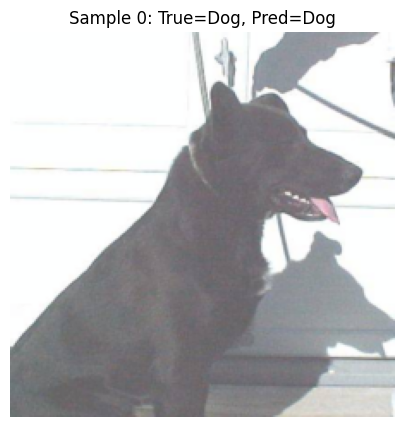


1. Grad-CAM Analysis:


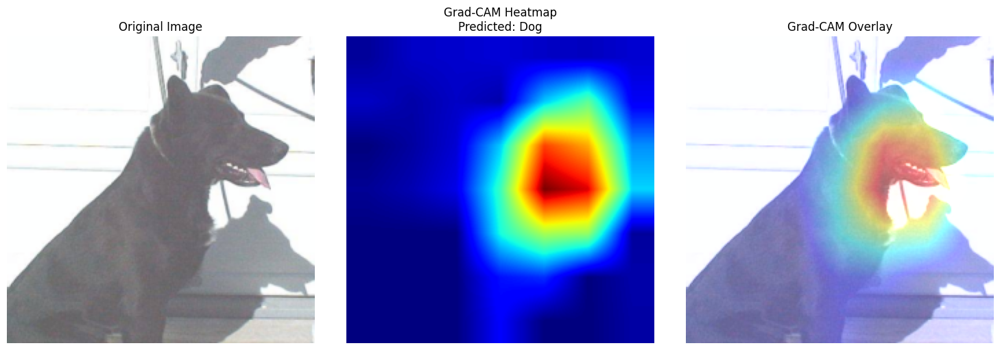


2. LIME Analysis:


100%|██████████| 1000/1000 [00:03<00:00, 323.86it/s]


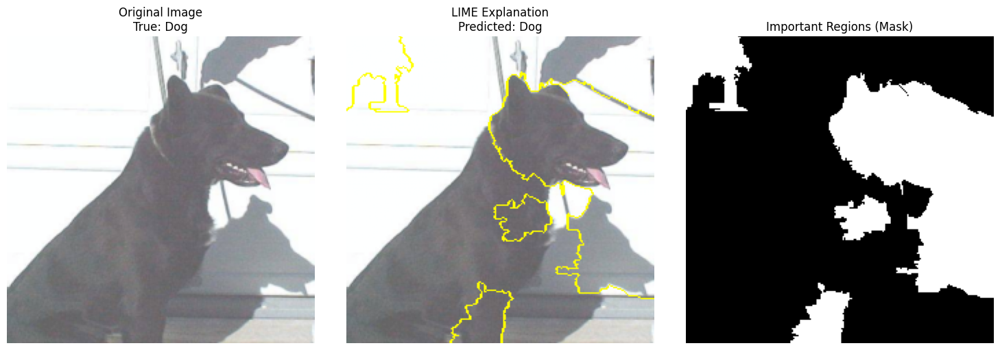


3. Occlusion Analysis:


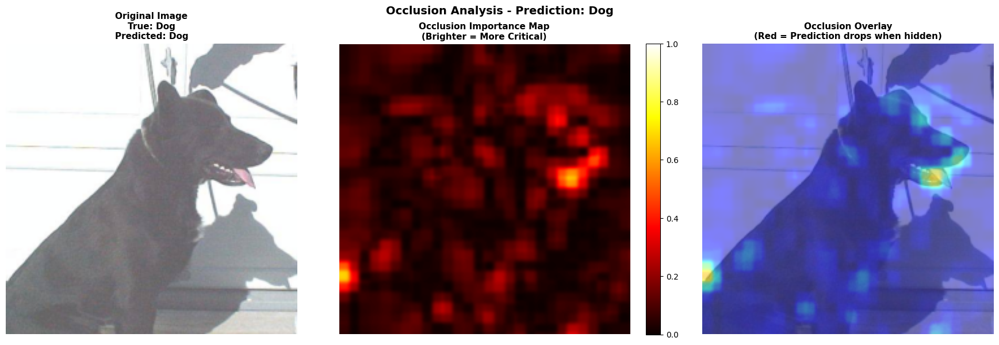


4. Integrated Gradients Analysis:


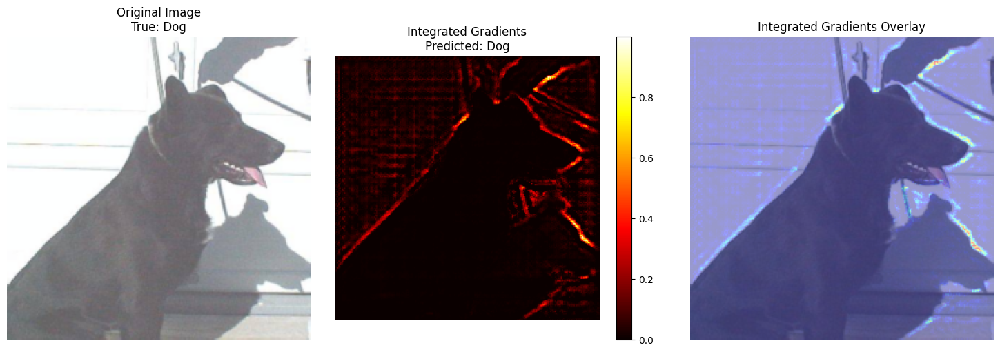


--------------------------------------------------------------------------------


Sample Index: 5
True Label: Dog
Predicted: Dog (Confidence: 0.9915)
Correct: V


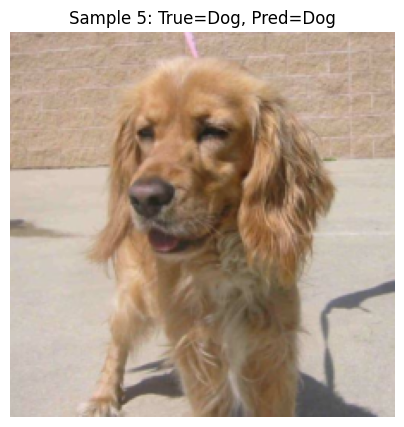


1. Grad-CAM Analysis:


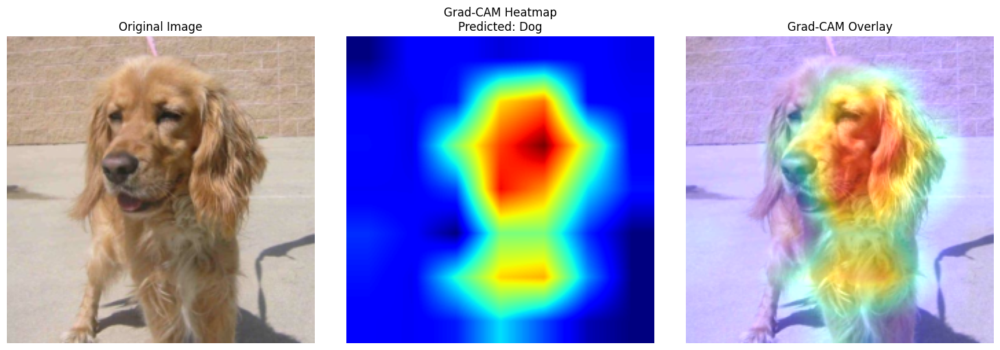


2. LIME Analysis:


100%|██████████| 1000/1000 [00:03<00:00, 251.20it/s]


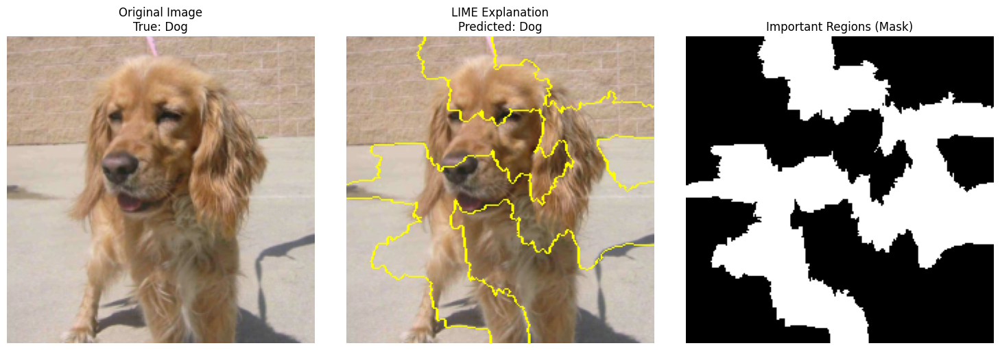


3. Occlusion Analysis:


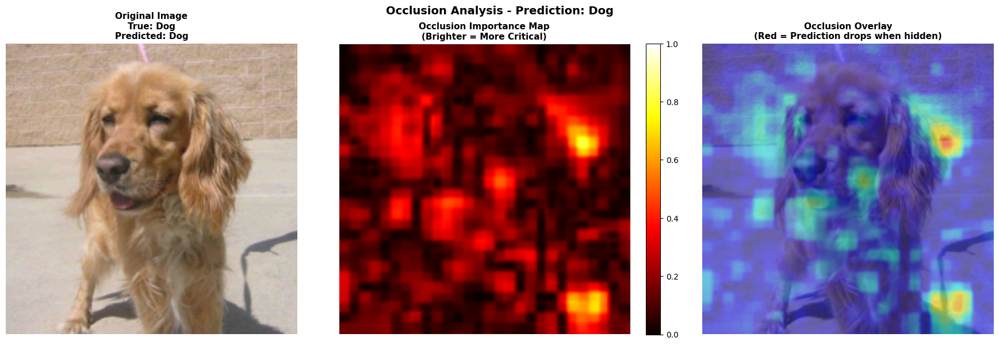


4. Integrated Gradients Analysis:


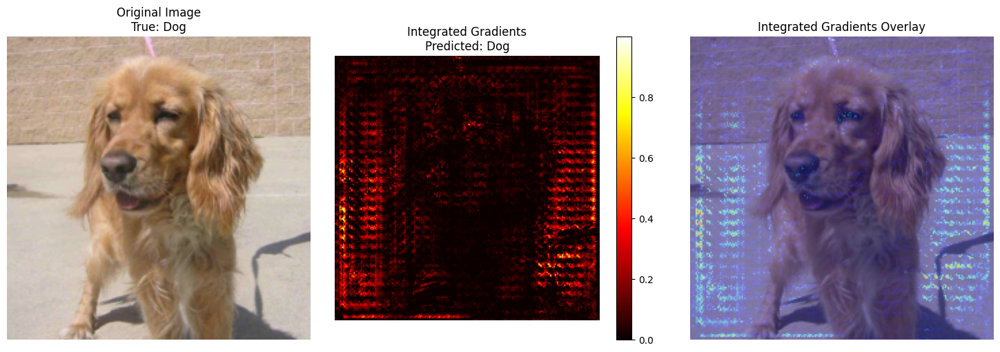


--------------------------------------------------------------------------------


Sample Index: 10
True Label: Cat
Predicted: Cat (Confidence: 1.0000)
Correct: V


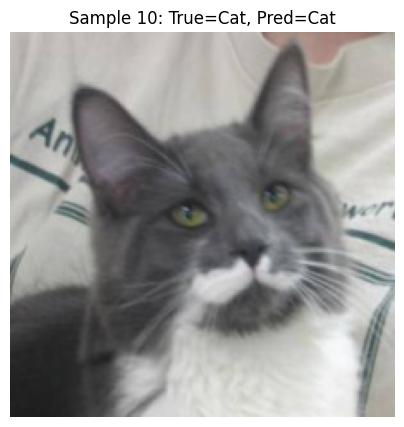


1. Grad-CAM Analysis:


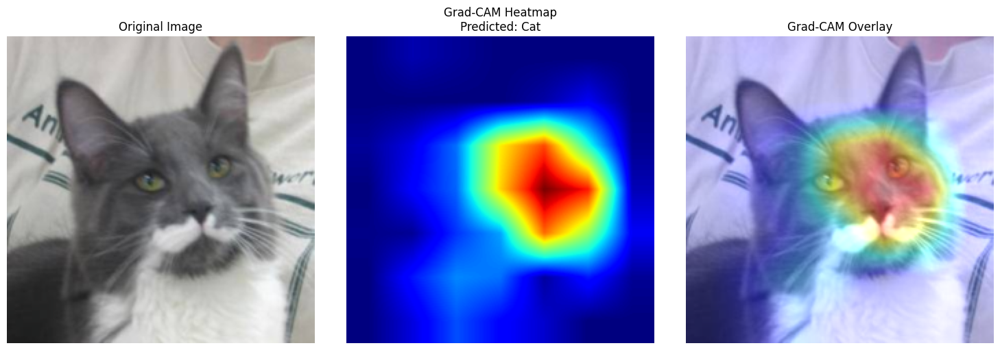


2. LIME Analysis:


100%|██████████| 1000/1000 [00:03<00:00, 318.01it/s]


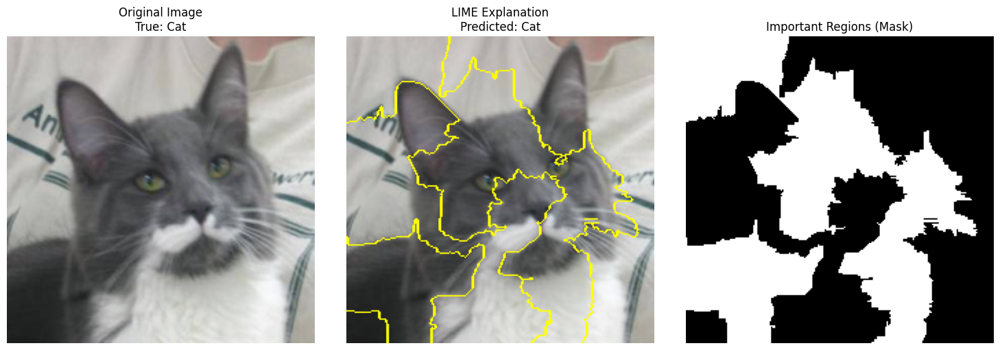


3. Occlusion Analysis:


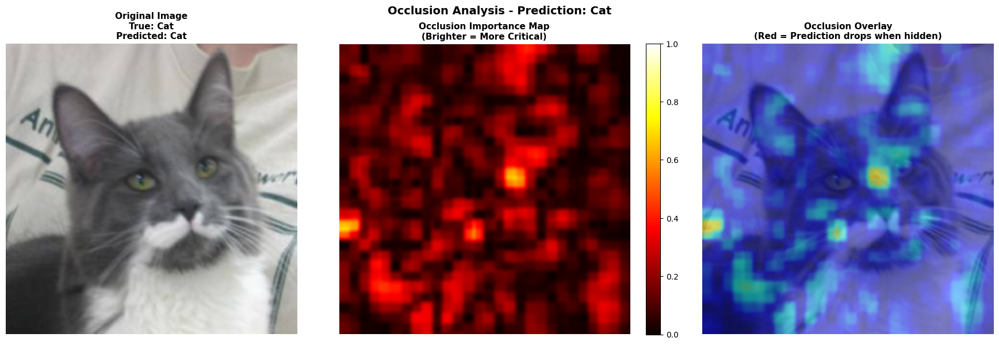


4. Integrated Gradients Analysis:


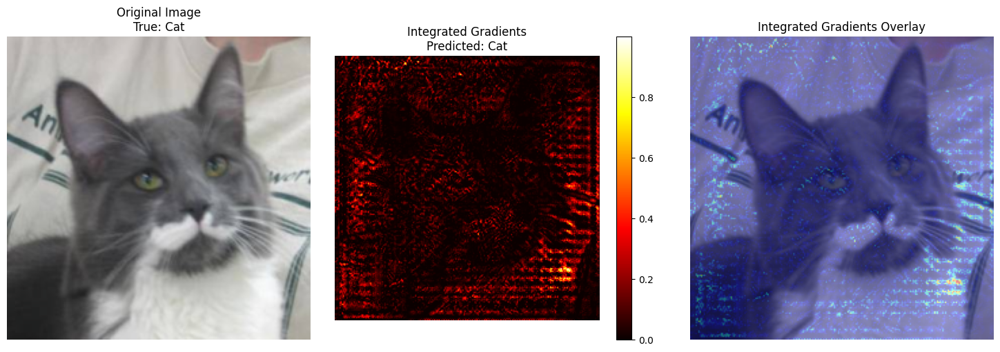


--------------------------------------------------------------------------------


Sample Index: 555
True Label: Dog
Predicted: Cat (Confidence: 0.9317)
Correct: X


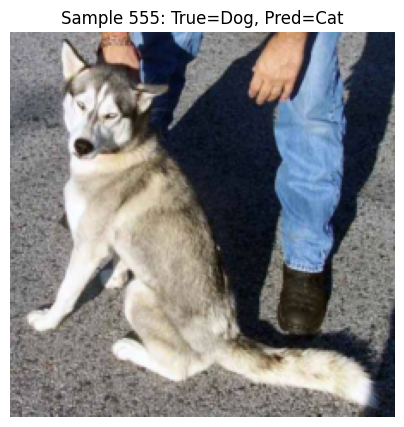


1. Grad-CAM Analysis:


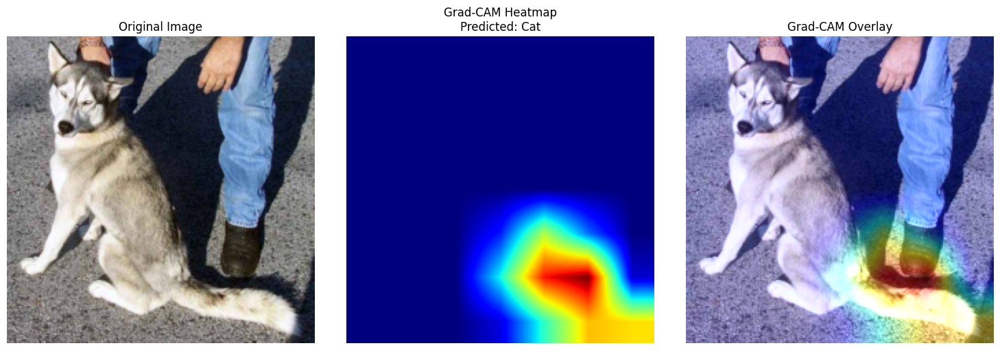


2. LIME Analysis:


100%|██████████| 1000/1000 [00:03<00:00, 325.55it/s]


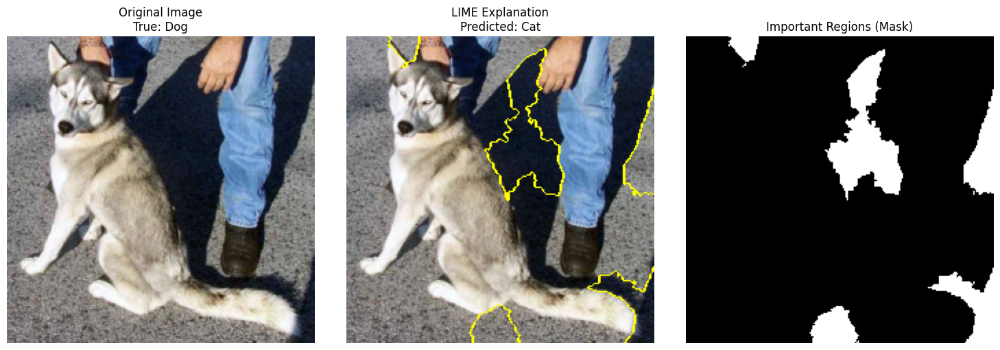


3. Occlusion Analysis:


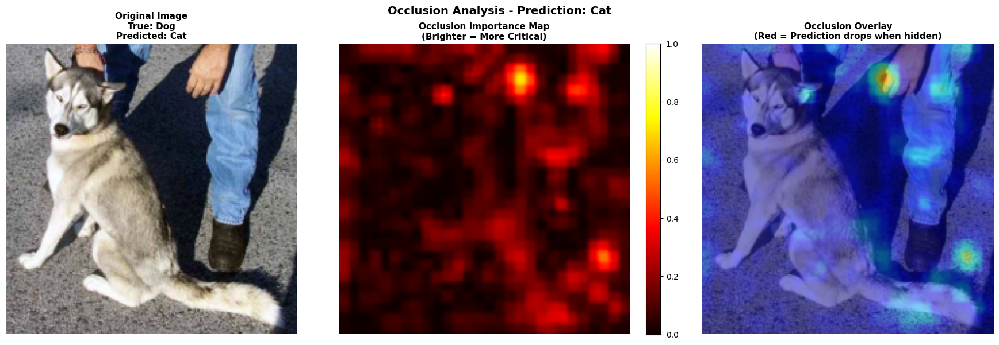


4. Integrated Gradients Analysis:


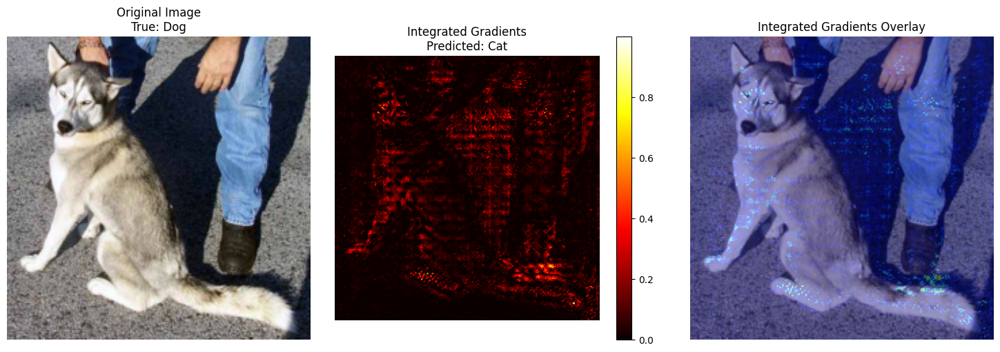


--------------------------------------------------------------------------------


Sample Index: 4
True Label: Cat
Predicted: Dog (Confidence: 0.5128)
Correct: X


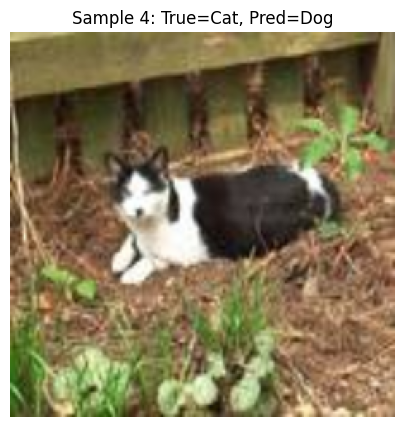


1. Grad-CAM Analysis:


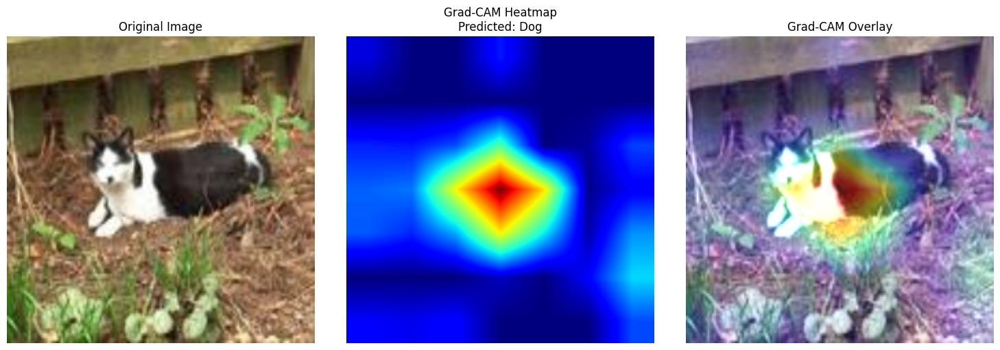


2. LIME Analysis:


100%|██████████| 1000/1000 [00:04<00:00, 229.30it/s]


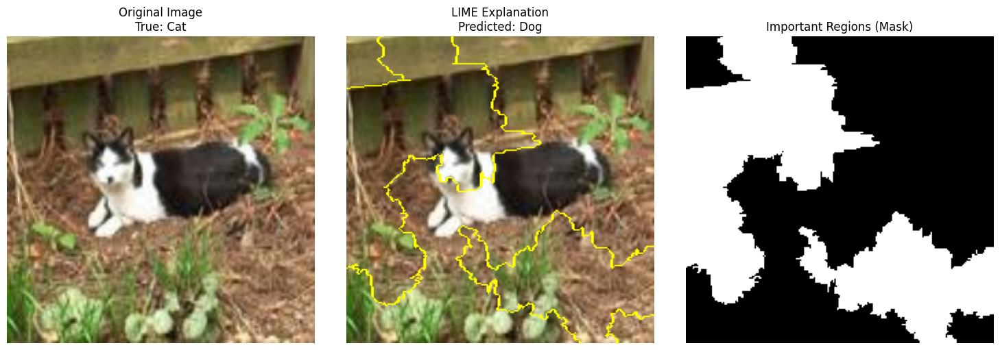


3. Occlusion Analysis:


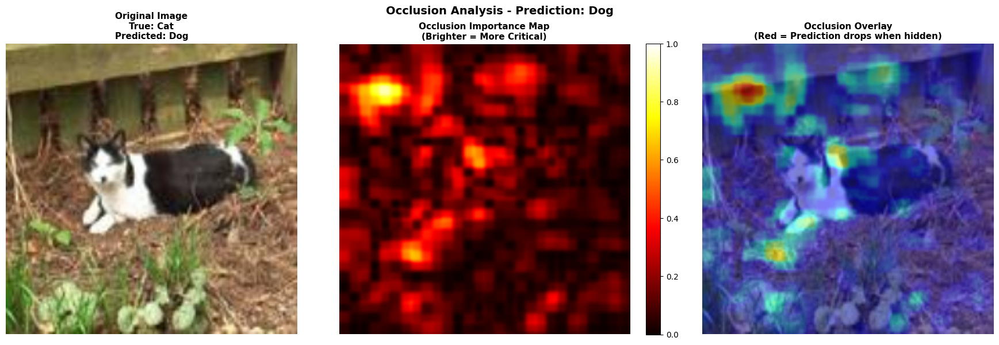


4. Integrated Gradients Analysis:


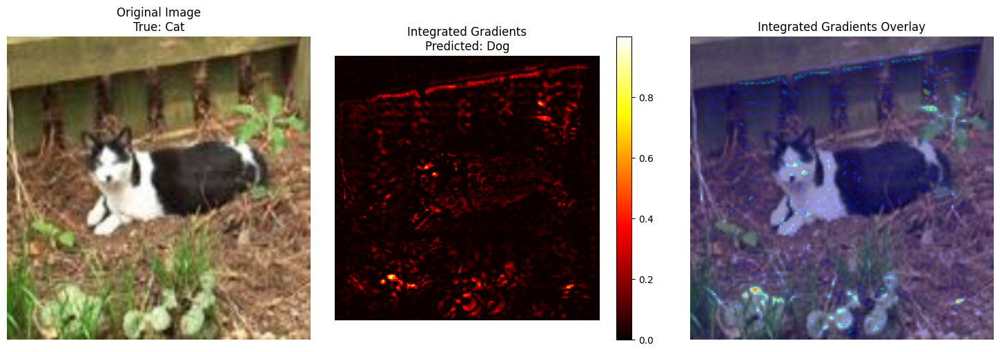


--------------------------------------------------------------------------------


Sample Index: 25
True Label: Dog
Predicted: Cat (Confidence: 0.8970)
Correct: X


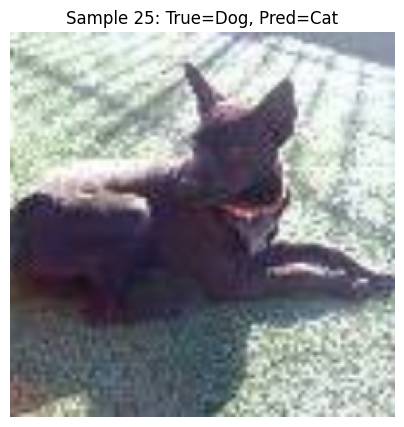


1. Grad-CAM Analysis:


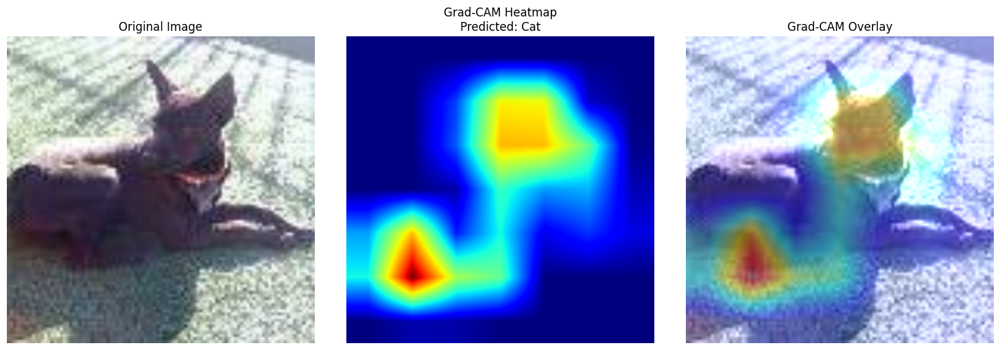


2. LIME Analysis:


100%|██████████| 1000/1000 [00:02<00:00, 358.50it/s]


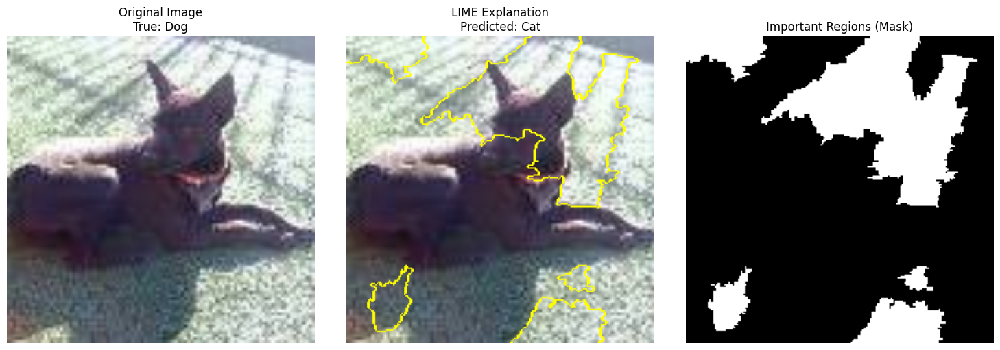


3. Occlusion Analysis:


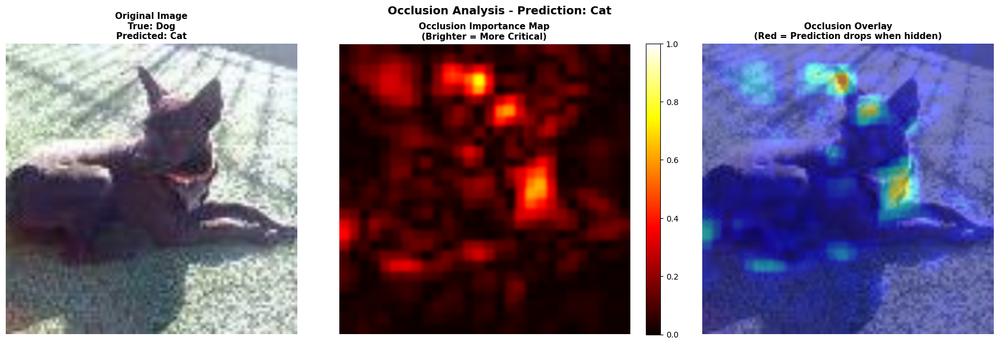


4. Integrated Gradients Analysis:


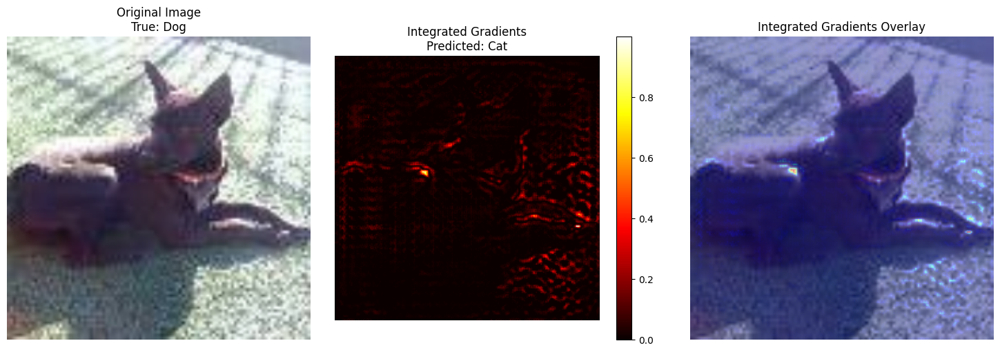


--------------------------------------------------------------------------------



In [17]:
class_names = ["Cat", "Dog"]

xai_results = []

for module in efficientnet.modules():
    module._forward_hooks.clear()
    module._backward_hooks.clear()

for idx in sample_indices:
    image_tensor, true_label = val_dataset[idx]
    predicted_label = all_predictions[idx]

    # Get prediction confidence
    with torch.no_grad():
        output = efficientnet(image_tensor.unsqueeze(0).to(device))
        probs = F.softmax(output, dim=1)
        confidence = probs[0][predicted_label].item()

    print("\n" + "=" * 80)
    print(f"Sample Index: {idx}")
    print(f"True Label: {class_names[true_label]}")
    print(f"Predicted: {class_names[predicted_label]} (Confidence: {confidence:.4f})")
    print(f"Correct: {'V' if true_label == predicted_label else 'X'}")
    print("=" * 80)

    # original image
    show_image(
        image_tensor,
        f"Sample {idx}: True={class_names[true_label]}, Pred={class_names[predicted_label]}",
    )

    original_image = denormalize_image(image_tensor)

    # Grad-CAM
    print("\n1. Grad-CAM Analysis:")
    try:
        gradcam_heatmap = visualize_gradcam(
            efficientnet, image_tensor, predicted_label, original_image, class_names
        )
    except Exception as e:
        print(f"Grad-CAM failed: {e}")
        gradcam_heatmap = None

    # LIME
    print("\n2. LIME Analysis:")
    try:
        lime_explanation = visualize_lime(
            image_tensor, true_label, predicted_label, class_names
        )
    except Exception as e:
        print(f"LIME failed: {e}")
        lime_explanation = None

    # Occlusion
    print("\n3. Occlusion Analysis:")
    try:
        occlusion_attributions = visualize_occlusion(
            efficientnet, image_tensor, true_label, predicted_label, class_names
        )
    except Exception as e:
        print(f"Occlusion failed: {e}")
        occlusion_attributions = None

    # Integrated Gradients
    print("\n4. Integrated Gradients Analysis:")
    try:
        ig_attributions = visualize_integrated_gradients(
            efficientnet, image_tensor, true_label, predicted_label, class_names
        )
    except Exception as e:
        print(f"Integrated Gradients failed: {e}")
        ig_attributions = None

    # Store results
    xai_results.append(
        {
            "index": idx,
            "true_label": class_names[true_label],
            "predicted_label": class_names[predicted_label],
            "confidence": confidence,
            "correct": true_label == predicted_label,
        }
    )

    print("\n" + "-" * 80 + "\n")